

Author: Marek Wodziński

Contact: wodzinski@agh.edu.pl

You are allowed to use these materials for all purposes as long as the credit is given.

The goal of Laboratory 6 is to:
<ol>
  <li> Learn how to reimplement architectures described in the scientific literature.
  <li> Get familiar with the UNet architecture.
  <li> Familarize yourself with the segmentation problem, together with the evaluation metrics.
  <li> Implement a tool to automatically segment surgical tools in the endoscopy images.
</ol>



The dataset is the same as during Laboratory 3: https://www.kaggle.com/datasets/debeshjha1/kvasirinstrument

The goal is to implement and train a neural network that is going to automatically segment the surgical instruments from the endoscopy images. Such a tool can be useful for numerous applications, e.g. vision-guided interventions, safety ensurance, mixed-reality visualization.

Start with loading the dataset with the preferred tool (direct download, wget tool, or kaggle interface to Google Colaboratory). Then mount the Google Drive (as during previous laboratories) and follow the notebook.

 

In this part you are going to use (or implement again) the Dataset implemented during Laboratory 3 (about dataloaders).

You will treat the endoscopy output as separate images, however, in reality they are video sequences and should be approached a bit differently. 

Start with importing the external libraries:

In [256]:
import os
import random
import numpy as np
import torch
import torchvision as tv
import pandas as pd
import matplotlib.pyplot as plt
import SimpleITK as sitk
from torchvision.transforms import transforms
from torch.utils.data import Dataset, DataLoader
from torchvision import datasets
from sklearn.model_selection import train_test_split
from PIL import Image
from scipy.ndimage import _ni_support
from scipy.ndimage.morphology import distance_transform_edt, binary_erosion, generate_binary_structure
from glob import glob
from torch.utils.tensorboard import SummaryWriter


In [257]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

Then create the dataset, define a dataloder and verify whether the images are loaded correctly. The dataset __getitem__ should output a tuple (image, mask), where the output should be resampled: the image to (3, 256, 256) and the mask to (1, 256, 256). The image should be normalized to [0-1] range and the mask should contain only 0 and 1 values. Based on your knowledge from the Laboratory 3 - implement the dataset in a way that is the most convinient to you (implement the logic directly in the class or first parse the folder structure into a .csv file).

In [258]:
dataset_path = "./lab3_data/kvasir-instrument"

image_files = [f for f in os.listdir(os.path.join(dataset_path, "images/images")) if f.endswith(".jpg")]
mask_files = [f for f in os.listdir(os.path.join(dataset_path, "masks/masks")) if f.endswith(".png")]

data = {'image_path': [], 'mask_path': []}

for image_file in image_files:
    image_path = os.path.join("images", image_file)
    mask_file = image_file.replace(".jpg", ".png")
    mask_path = os.path.join("masks", mask_file)

    data['image_path'].append(image_path)
    data['mask_path'].append(mask_path)

df = pd.DataFrame(data)

if len(df) == 0:
    raise ValueError("Dataset is empty. Adjust dataset path or check dataset contents.")


train_ratio, val_ratio, test_ratio = 0.7, 0.1, 0.2

train_df, test_df = train_test_split(df, test_size=val_ratio + test_ratio, random_state=42)
val_df, test_df = train_test_split(test_df, test_size=test_ratio / (val_ratio + test_ratio), random_state=42)

train_csv_path = "lab3_data/kvasir-instrument/training_dataset.csv"
val_csv_path = "lab3_data/kvasir-instrument/validation_dataset.csv"
test_csv_path = "lab3_data/kvasir-instrument/testing_dataset.csv"

train_df.to_csv(train_csv_path, index=False)
val_df.to_csv(val_csv_path, index=False)
test_df.to_csv(test_csv_path, index=False)

print(f"Training CSV saved to: {train_csv_path}")
print(f"Validation CSV saved to: {val_csv_path}")
print(f"Testing CSV saved to: {test_csv_path}")

Training CSV saved to: lab3_data/kvasir-instrument/training_dataset.csv
Validation CSV saved to: lab3_data/kvasir-instrument/validation_dataset.csv
Testing CSV saved to: lab3_data/kvasir-instrument/testing_dataset.csv


In [259]:
class EndoscopySegmentationDataset(Dataset):
    def __init__(self, dataset_path, csv_path, transforms=None, z_norm=False, target_size=(224, 224)):
        self.dataset_path = dataset_path
        self.csv_path = csv_path
        self.transforms = transforms
        self.z_norm = z_norm
        self.target_size = target_size

        
        self.dataframe = pd.read_csv(csv_path)

    def __len__(self):
        return len(self.dataframe)

    def __getitem__(self, idx):
        
        img_path = os.path.join(self.dataset_path,"images", self.dataframe.iloc[idx]['image_path'])
        mask_path = os.path.join(self.dataset_path,"masks", self.dataframe.iloc[idx]['mask_path'])

        
        img = Image.open(img_path).convert("RGB")  
        mask = Image.open(mask_path).convert("L")  

        
        if self.transforms is not None:
            img = self.transforms(img)
            mask = self.transforms(mask)
        
        return img, mask

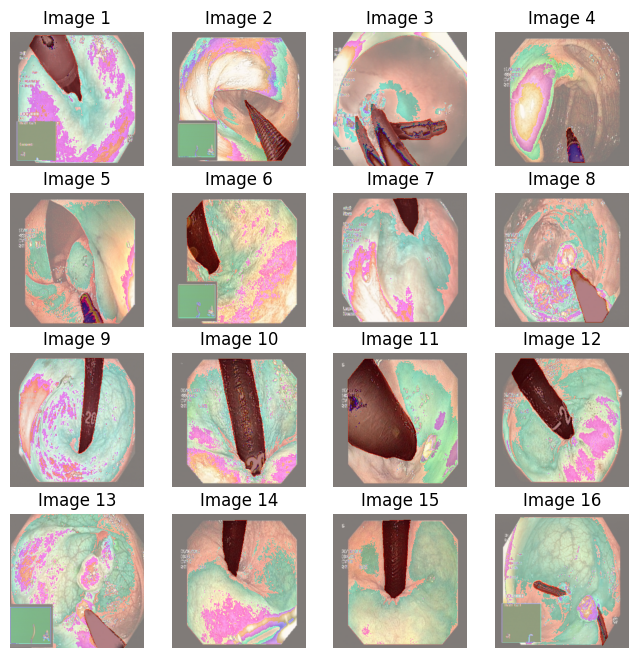

In [260]:
batch_size = 16
shuffle = True

data_transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5], std=[0.5]),  
])

training_dataset = EndoscopySegmentationDataset(os.path.join(dataset_path), train_csv_path, transforms=data_transform)
training_dataloader = tc.utils.data.DataLoader(training_dataset, batch_size=batch_size, shuffle=shuffle)

testing_dataset = EndoscopySegmentationDataset(os.path.join(dataset_path), test_csv_path, transforms=data_transform)
testing_dataloader = tc.utils.data.DataLoader(testing_dataset, batch_size=batch_size, shuffle=shuffle)

validation_dataset = EndoscopySegmentationDataset(os.path.join(dataset_path), val_csv_path, transforms=data_transform)
validation_dataloader = tc.utils.data.DataLoader(validation_dataset, batch_size=batch_size, shuffle=shuffle)

for images, masks in training_dataloader:
    
    num_images = len(images)
    fig, axs = plt.subplots(4, 4, figsize=(8, 8))

    for i in range(num_images):
        row = i // 4
        col = i % 4

        
        image = F.to_pil_image(images[i])
        mask = F.to_pil_image(masks[i])

        axs[row, col].imshow(image)
        axs[row, col].imshow(mask, alpha=0.5, cmap='Reds')  
        axs[row, col].set_title(f'Image {i + 1}')
        axs[row, col].axis('off')

    plt.show()
    break  

In [261]:
print(training_dataloader)

## Part II - Neural Network Architecture (UNet)

You should observe the output as above. The next task will be to implement the neural network architecture.

The next task is to implement a UNet architecture dedicated to the image segmentation.

Before starting you may want to refresh your knowledge about:

Convolutional layers: https://machinelearningmastery.com/convolutional-layers-for-deep-learning-neural-networks/

Normalization: https://machinelearningmastery.com/batch-normalization-for-training-of-deep-neural-networks/

Activation functions: https://www.section.io/engineering-education/activation-functions/

Let's start with a brief historical introduction. A serious breakthrough in medical image segmentation, and then also in computer vision segmentation, was related to the introduction of the U-Net architecture during MICCAI 2015, one of the most prestigious conferences in medical image computing. A preprint of the scientific article is available at: https://arxiv.org/pdf/1505.04597.pdf. You should read the article before continuing since you are going to implement the described architecture.

The U-Net architecture is an example of an encoder-decoder architecture, where the encoder (the "left side of U") is responsible for creating an embedding in the latent space. We will discuss latent spaces and embeddings in more details during Lecture/Laboratory 8/9. On the other hand, the decoder (the "right side of U") is responsible for transforming the representation in latent space to the output image with the same shape as the input, however, this time representing the binary mask containing the segmented structures.

The U-Net architecture contains three critical structures that made it successful in the segmentation context and then also in other applications (registration, reconstruction, detection, generation..).

<ul>
<li> The use of the max-pool to decrease the representation size in the subsequent layers, and as a result - increase of the receptive field without significantly increasing the network depth and number of parameters. For a quick recap about the receptive field: https://www.baeldung.com/cs/cnn-receptive-field-size. The receptive field is crucial for neural networks. The architecture should be designed in a way that is able to capture the global context. Unfortunately, the local characteristic of the convolution operator makes it difficult, therefore other architectures were proposed (e.g. Vision Transformer, discussed during the second part of the course). Nevertheless, the convolutional networks are still extremerly useful, especially for the applications without the requirement about the global context (e.g. the one discussed during this laboratory).

<li> The introduction of skip-connections between different architecture levels. It not only further increased the receptive field but also decreased the risk of gradient vanishing. The direct connections between encoder and decoder at higher resolution levels make it possible to unify and better represent the features.

<li> The application of so called deconvolution (transposed convolution) in the decoder. The transposed convolution made it possible to learn features responsible for interpolating the latent space represenation into higher dimensions, to produce more accurate binary masks. It may be treated as learned, nonlinear interpolation.
</ul> 

Now, implement the U-Net architecture (based on the article). However, introduce the following changes:
<ul>
<li> Introduce the BatchNorm2D layers that are not described in the article.
<li> Assume that the input and output size is (3x256x256) and (1x256x256) respectively. You can achieve it be setting the correct padding parameters in the convolutional and deconvolutional layers.
</ul>

In [262]:
class UNet(nn.Module):
    def __init__(self):
        super(UNet, self).__init__()

        
        self.encoder = nn.Sequential(
            nn.Conv2d(3, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        
        self.middle = nn.Sequential(
            nn.Conv2d(64, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2)
        )

        
        self.decoder = nn.Sequential(
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.ConvTranspose2d(64, 1, kernel_size=2, stride=2),
        )

    def forward(self, x):
        
        x1 = self.encoder(x)

        
        x2 = self.middle(x1)

        
        x3 = self.decoder(x2)

        return x3

And verify whether the loaded images pass through the network without any errors:

In [263]:
model = UNet()
print(model)

UNet(
  (encoder): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (middle): Sequential(
    (0): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
 

In [264]:
print(training_dataloader)

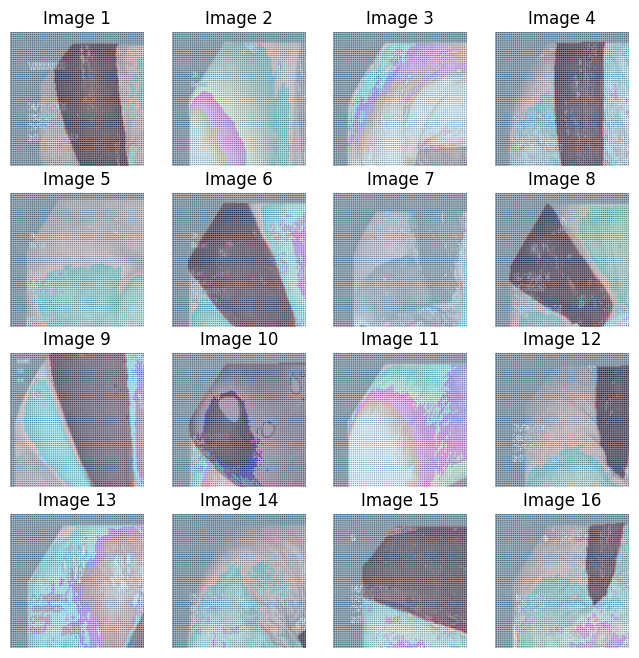

In [265]:
model.eval()

for images, masks in training_dataloader:
    
    num_images = len(images)
    fig, axs = plt.subplots(4, 4, figsize=(8, 8))

    with torch.no_grad():
        for i in range(num_images):
            row = i // 4
            col = i % 4

            image = F.to_pil_image(images[i])
            mask = F.to_pil_image(masks[i])

            
            input_image = transforms.ToTensor()(image).unsqueeze(0)

            
            output_mask = model(input_image)

            
            output_mask_image = F.to_pil_image(output_mask.squeeze())

            axs[row, col].imshow(image)
            axs[row, col].imshow(mask, alpha=0.5, cmap='Reds')  
            axs[row, col].imshow(output_mask_image, alpha=0.5, cmap='Blues')  
            axs[row, col].set_title(f'Image {i + 1}')
            axs[row, col].axis('off')

    plt.show()
    break


You should observe that the network outputs just a noise. It is expected since the network has not been trained yet.

## Part III - Neural Network Training

The next part is related to the network training. You are going to implement a training procedure similar to the procedures from previous laboratories (still fully supervised learning).

Remember that the segmentation problem is in fact just a classification problem but at the pixel/voxel-level, instead of the image-level. Therefore, the same cost functions can be applied. During this exercise you should apply the Soft Dice Loss (implemented below). The training function should be similar to the one from Laboratory 5 with slight changes related to different ground-truth representation.

First, create a split between training, validation, and test sets (70:10:20) and create separate dataloaders:

Now define the training parameters and create the TensorBoard logger:

In [267]:
learning_rate = 0.005
model = UNet()
batch_size = 4
num_epochs = 20
parameters = model.parameters()
optimizer = tc.optim.Adam(parameters, lr=learning_rate)
logger = SummaryWriter(log_dir="/content/logs/UNet", comment="UNet")


def dice_loss(prediction, target):
    smooth = 1
    prediction = prediction.contiguous().view(-1)
    target = target.contiguous().view(-1)
    intersection = tc.sum(prediction * target)
    return 1 - ((2 * intersection + smooth) / (prediction.sum() + target.sum() + smooth))
    
objective_function = dice_loss

And finally implement and run the training function:

In [269]:
import torch.nn.functional as F

def training(model, training_dataloader, validation_dataloader,
             objective_function, optimizer, num_epochs, logger, device):
    
    model.to(device)

        
    print(f"Training Dataset size: {len(training_dataloader.dataset)}")
    print(f"Validation Dataset size: {len(validation_dataloader.dataset)}")
    
    
    for epoch in range(num_epochs):
        model.train()
        total_loss = 0.0
        
        
        for batch_idx, (images, masks) in enumerate(training_dataloader):
            images, masks = images.to(device), masks.to(device)
            
            
            output_masks = model(images)
            
            
            masks_resized = F.interpolate(masks, size=output_masks.size()[2:], mode='nearest')
            
            
            loss = objective_function(output_masks, masks_resized)
            
            
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            
            total_loss += loss.item()
        
        
        average_train_loss = total_loss / len(training_dataloader)
        
        
        model.eval()
        total_val_loss = 0.0
        
        with torch.no_grad():
            for val_images, val_masks in validation_dataloader:
                val_images, val_masks = val_images.to(device), val_masks.to(device)
                
                
                val_output_masks = model(val_images)
                
                
                val_masks_resized = F.interpolate(val_masks, size=val_output_masks.size()[2:], mode='nearest')
                
                
                val_loss = objective_function(val_output_masks, val_masks_resized)
                
                total_val_loss += val_loss.item()
        
        
        average_val_loss = total_val_loss / len(validation_dataloader)
        
        
        logger.add_scalar('Loss/Train', average_train_loss, epoch)
        logger.add_scalar('Loss/Validation', average_val_loss, epoch)
        
        print(f'Epoch [{epoch + 1}/{num_epochs}], '
              f'Training Loss: {average_train_loss:.4f}, '
              f'Validation Loss: {average_val_loss:.4f}')
        
    print('Training completed.')

In [270]:

logger = SummaryWriter(log_dir="/content/logs/UNet", comment="UNet")
training(model, training_dataloader, validation_dataloader, objective_function, optimizer, num_epochs, logger, device)

Training Dataset size: 412
Validation Dataset size: 59


Epoch [1/20], Training Loss: 3.4929, Validation Loss: 2.5092
Epoch [2/20], Training Loss: -0.0332, Validation Loss: 2.9828
Epoch [3/20], Training Loss: 0.2154, Validation Loss: 3.3251
Epoch [4/20], Training Loss: 4.5109, Validation Loss: -6.5624
Epoch [5/20], Training Loss: -3.3084, Validation Loss: 3.0350
Epoch [6/20], Training Loss: 2.9801, Validation Loss: 2.8926
Epoch [7/20], Training Loss: 2.8742, Validation Loss: 2.8833
Epoch [8/20], Training Loss: 2.7969, Validation Loss: 2.8324
Epoch [9/20], Training Loss: 2.7342, Validation Loss: 2.8073
Epoch [10/20], Training Loss: 2.6656, Validation Loss: 2.6510
Epoch [11/20], Training Loss: 2.5635, Validation Loss: 2.5973
Epoch [12/20], Training Loss: 2.4597, Validation Loss: 2.4041
Epoch [13/20], Training Loss: 2.3414, Validation Loss: 2.2545
Epoch [14/20], Training Loss: 2.2285, Validation Loss: 2.3016
Epoch [15/20], Training Loss: 2.0427, Validation Loss: 1.9051
Epoch [16/20], Training Loss: 1.9106, Validation Loss: 1.8152
Epoch [17/20],

In the final part you are going to evaluate the trained network.

As you remember from the lecture - the medical image segmentation is usually evaluated using the Dice coefficient and Hausdorff distance. The Dice coefficient (in fact just a F1-score) measures the volumetric agreement while the Hausdorff distance is used to evaluate the correspondence between edges. Both the evaluation metrics should be used together. However, both of them are assosciated with particular drawbacks (see: https://arxiv.org/abs/2206.01653)

Below you can find implemented the Dice'a coefficient and the Hausdorff distance. You are going to use them to evaluate the segmentation results.

In [271]:
def dc(input1, input2):
    input1 = np.atleast_1d(input1)
    input2 = np.atleast_1d(input2)
    
    
    intersection = np.count_nonzero(np.logical_and(input1, input2))
    size_i1 = np.count_nonzero(input1)
    size_i2 = np.count_nonzero(input2)
    
    try:
        dc = 2. * intersection / float(size_i1 + size_i2)
    except ZeroDivisionError:
        dc = 0.0
    
    return dc

def __surface_distances(result, reference, voxelspacing=None, connectivity=1):
    result = np.atleast_1d(result)
    reference = np.atleast_1d(reference)
    if voxelspacing is not None:
        voxelspacing = _ni_support._normalize_sequence(voxelspacing, result.ndim)
        voxelspacing = np.asarray(voxelspacing, dtype=np.float64)
        if not voxelspacing.flags.contiguous:
            voxelspacing = voxelspacing.copy()
    footprint = generate_binary_structure(result.ndim, connectivity)
    if 0 == np.count_nonzero(result): 
        raise RuntimeError('The first supplied array does not contain any binary object.')
    if 0 == np.count_nonzero(reference): 
        raise RuntimeError('The second supplied array does not contain any binary object.')    
    result_border = np.logical_xor(result, binary_erosion(result, structure=footprint, iterations=1))
    reference_border = np.logical_xor(reference, binary_erosion(reference, structure=footprint, iterations=1))
    dt = distance_transform_edt(~reference_border, sampling=voxelspacing)
    sds = dt[result_border]
    return sds


C:\Users\Mateleo\AppData\Local\Temp\ipykernel_4924\2569409338.py:2: DeprecationWarning: Please use `distance_transform_edt` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  from scipy.ndimage.morphology import distance_transform_edt, binary_erosion, generate_binary_structure
C:\Users\Mateleo\AppData\Local\Temp\ipykernel_4924\2569409338.py:2: DeprecationWarning: Please use `binary_erosion` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  from scipy.ndimage.morphology import distance_transform_edt, binary_erosion, generate_binary_structure
C:\Users\Mateleo\AppData\Local\Temp\ipykernel_4924\2569409338.py:2: DeprecationWarning: Please use `generate_binary_structure` from the `scipy.ndimage` namespace, the `scipy.ndimage.morphology` namespace is deprecated.
  from scipy.ndimage.morphology import distance_transform_edt, binary_erosion, generate_binary_structure


Now use them to evaluate the segmentation results for all the datasets (training, validation and testing).

In [272]:
def calculate_scores(model, dataloader, batch_size):
    dices = []
    hds95 = []
    
    model.eval()
    
    with torch.no_grad():
        for images, masks in dataloader:
            images, masks = images.to(device), masks.to(device)
            
            
            output_masks = model(images)
            
            
            output_masks_resized = F.interpolate(output_masks, size=masks.shape[2:], mode='nearest')
            
            
            predicted_masks = (output_masks_resized > 0.5).float()
            
            
            predicted_np = predicted_masks.cpu().numpy()
            target_np = masks.cpu().numpy()
            
            
            dice = dc(predicted_np, target_np)
            dices.append(dice)
            
            
            hd95_value = hd95(predicted_np, target_np)
            hds95.append(hd95_value)
    
    return dices, hds95


optimizer.zero_grad()


training_dices, training_hds95 = calculate_scores(model, training_dataloader, batch_size)
validation_dices, validation_hds95 = calculate_scores(model, validation_dataloader, batch_size)
testing_dices, testing_hds95 = calculate_scores(model, testing_dataloader, batch_size)


print(f"Training Dice Mean: {np.array(training_dices).mean()}")
print(f"Training Dice Std: {np.array(training_dices).std()}")
print(f"Training Dice Min: {np.array(training_dices).min()}")
print(f"Training Dice Max: {np.array(training_dices).max()}")

print(f"Validation Dice Mean: {np.array(validation_dices).mean()}")
print(f"Validation Dice Std: {np.array(validation_dices).std()}")
print(f"Validation Dice Min: {np.array(validation_dices).min()}")
print(f"Validation Dice Max: {np.array(validation_dices).max()}")

print(f"Testing Dice Mean: {np.array(testing_dices).mean()}")
print(f"Testing Dice Std: {np.array(testing_dices).std()}")
print(f"Testing Dice Min: {np.array(testing_dices).min()}")
print(f"Testing Dice Max: {np.array(testing_dices).max()}")

print()

print(f"Training HD95 Mean: {np.array(training_hds95).mean()}")
print(f"Training HD95 Std: {np.array(training_hds95).std()}")
print(f"Training HD95 Min: {np.array(training_hds95).min()}")
print(f"Training HD95 Max: {np.array(training_hds95).max()}")

print(f"Validation HD95 Mean: {np.array(validation_hds95).mean()}")
print(f"Validation HD95 Std: {np.array(validation_hds95).std()}")
print(f"Validation HD95 Min: {np.array(validation_hds95).min()}")
print(f"Validation HD95 Max: {np.array(validation_hds95).max()}")

print(f"Testing HD95 Mean: {np.array(testing_hds95).mean()}")
print(f"Testing HD95 Std: {np.array(testing_hds95).std()}")
print(f"Testing HD95 Min: {np.array(testing_hds95).min()}")
print(f"Testing HD95 Max: {np.array(testing_hds95).max()}")


Training Dice Mean: 0.6064849473370885
Training Dice Std: 0.03657822247690733
Training Dice Min: 0.5536723163841808
Training Dice Max: 0.6948074902786698
Validation Dice Mean: 0.5963095467080427
Validation Dice Std: 0.013110303003212863
Validation Dice Min: 0.5806000980039148
Validation Dice Max: 0.611733984493855
Testing Dice Mean: 0.5952054404909899
Testing Dice Std: 0.032154699310855996
Testing Dice Min: 0.5497636362127578
Testing Dice Max: 0.6506976634744347

Training HD95 Mean: 1.3823509806520877
Training HD95 Std: 0.11037522080220015
Training HD95 Min: 1.0
Training HD95 Max: 1.4142135623730951
Validation HD95 Mean: 1.4142135623730951
Validation HD95 Std: 0.0
Validation HD95 Min: 1.4142135623730951
Validation HD95 Max: 1.4142135623730951
Testing HD95 Mean: 1.4142135623730951
Testing HD95 Std: 0.0
Testing HD95 Min: 1.4142135623730951
Testing HD95 Max: 1.4142135623730951


Next, perform the qualitative evaluation by showing the ground-truth segmentation next to the predicted ones:

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


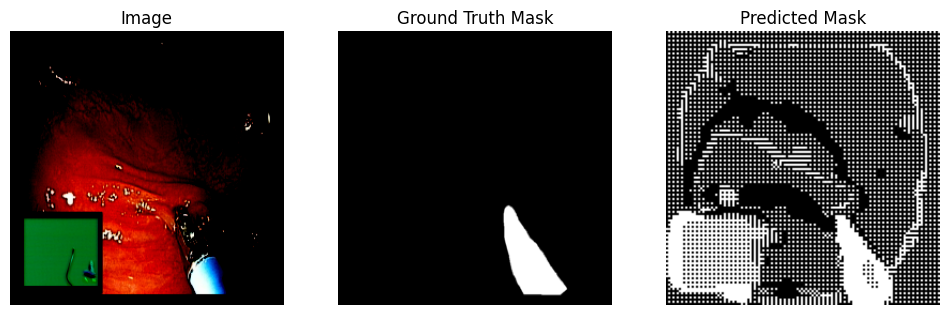

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


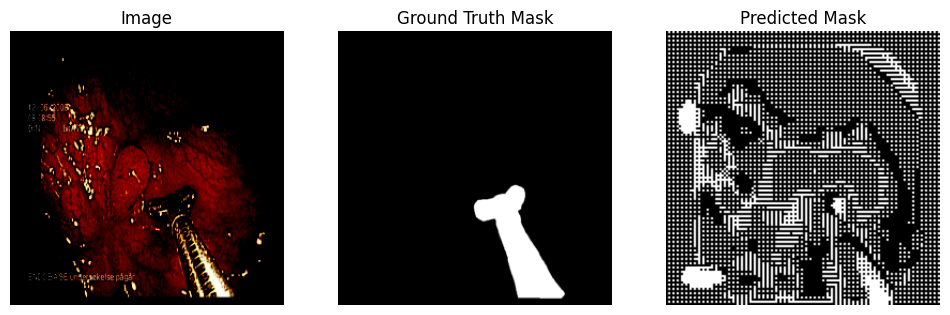

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


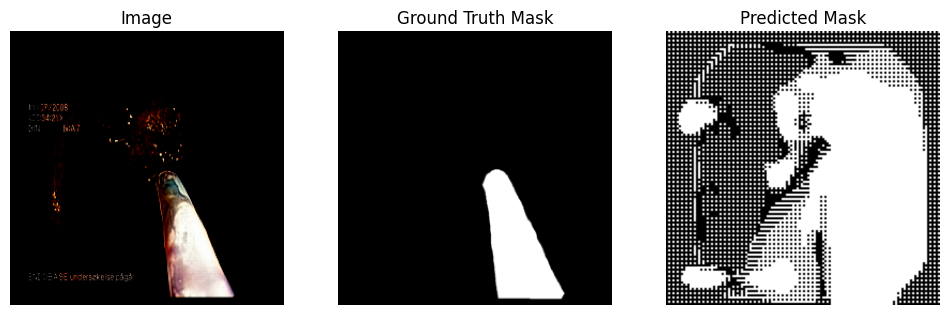

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


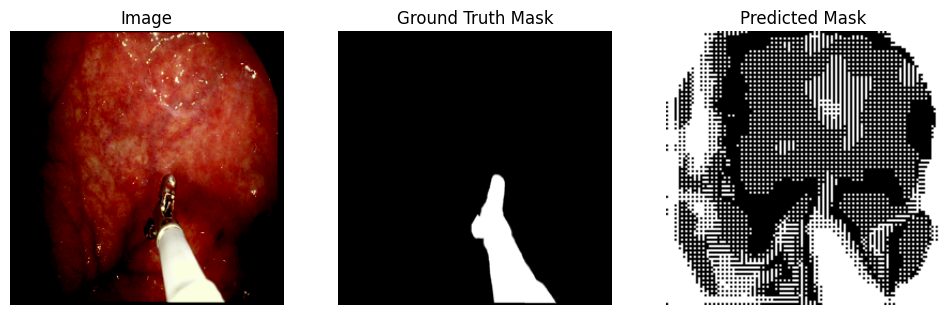

In [273]:
def visualize_predictions(model, dataloader, num_images=4):
    model.eval()
    
    with torch.no_grad():
        for i, (images, masks) in enumerate(dataloader):
            if i >= num_images:
                break

            images, masks = images.to(device), masks.to(device)
            
            
            output_masks = model(images)
            predicted_masks = (output_masks > 0.5).float()

            
            images_np = images.cpu().numpy()
            masks_np = masks.cpu().numpy()
            predicted_np = predicted_masks.cpu().numpy()

            
            for j in range(0,1):
                plt.figure(figsize=(12, 4))
                
                plt.subplot(1, 3, 1)
                plt.imshow(images_np[j].transpose(1, 2, 0))  
                plt.title('Image')
                plt.axis('off')

                plt.subplot(1, 3, 2)
                plt.imshow(masks_np[j, 0], cmap='gray')  
                plt.title('Ground Truth Mask')
                plt.axis('off')

                plt.subplot(1, 3, 3)
                plt.imshow(predicted_np[j, 0], cmap='gray')  
                plt.title('Predicted Mask')
                plt.axis('off')

                plt.show()


visualize_predictions(model, validation_dataloader, num_images=4)


What can you say about the segmentation results, both from the qualitative and the quantitative perspectives? Do you see the differences between the traning and the testing sets? How to improve the results?

I need to train MOOOOOOOOOOOOOOOOOORE

This is the end of Laboratory 6. You should be now familiar with:
<ol>
  <li> How to implement a NN architecture described in literature.
  <li> The encoder-decoder architectures with the UNet as an example.
  <li> How to evaluate the segmentation algorithms.
</ol>

The next lecture / laboratory will discuss the medical image registration. You are going to implement both an iterative algorithm and a neural network to peform the automatic medical image registration and analyze the registration quality.